# Procesamiento de Señales e Imágenes
**USACH - 2025-1**

**Profesor de cátedra:** Cristóbal Loyola

**Profesor yudante:** Clemente Aguilar

(*Notebook creado por Cristóbal L.*) <br>
(*Modificaciones para sesión práctica por Clemente A.*)

# Semana 2
**Contenidos:**

- Introducción a Colab
- Manipulación de imágenes con Python:
    - Cargar imágenes
    - Recorrer imágenes con índices
    - Graficar imágenes
- Operaciones:
    - Histograma
    - Negativo de una imagen
    - Histograma acumulado
- Binarización:
    - Umbral fijo
    - Algoritmo de Otsu
    - Binarización adaptativa



## Importar bibliotecas

Para poder manipular las imágenes utilizaremos las siguientes bibliotecas especializadas:

- **Matplotlib:** permite la generación de gráficos a partir de datos contenidos en listas o arrays.
https://matplotlib.org/

- **NumPy:** da soporte para crear vectores y matrices multidimensionales, junto con una gran colección de funciones matemáticas de alto nivel para operar con ellas.
https://numpy.org/

- **scikit-image:** incluye algoritmos para trabajar con imágenes en tareas como segmentación, transformaciones geométricas, manipulación en el espacio de color, filtrado, morfología, extracción de features, etc.
https://scikit-image.org/

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

from skimage import data, filters, io

## Descargar imágenes

Para las pruebas estaremos utilizando imágenes del repositorio *USC-SIPI Image Database*:

https://sipi.usc.edu/database/database.php?volume=misc

El subconjunto que utilizaremos contiene 44 imágenes, 14 de ellas a color y 30 en escala de grises. Por otro lado, hay imágenes de 3 tamaños distintos:

- 256 x 256 pixeles: 14 imágenes
- 512 x 512 pixeles: 26 imágenes
- 1024 x 1024 pixeles: 4 imágenes

In [ ]:
# creamos un directorio
!mkdir /content/images
# nos movemos al directorio recién creado
%cd /content/images
# descargamos el archivo desde el link especificado
!wget https://sipi.usc.edu/database/misc.zip
# descomprimimos el fichero .zip
!unzip -q misc.zip
# nos movemos al directorio recién extraído
%cd /content/images/misc/
# mostramos el contenido del directorio actual
!ls

mkdir: cannot create directory ‘/content/images’: File exists
/content/images
--2025-05-27 19:33:21--  https://sipi.usc.edu/database/misc.zip
Resolving sipi.usc.edu (sipi.usc.edu)... 68.181.2.90
Connecting to sipi.usc.edu (sipi.usc.edu)|68.181.2.90|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10512846 (10M) [application/zip]
Saving to: ‘misc.zip.1’

misc.zip.1          100%[===================>]  10.03M  17.7MB/s    in 0.6s    

2025-05-27 19:33:22 (17.7 MB/s) - ‘misc.zip.1’ saved [10512846/10512846]

replace misc/4.1.01.tiff? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
# Descargaremos algunas imágenes adicionales desde skimage (puede tomar un poco de tiempo)
data.download_all("/content/images/misc/")
!mv data/* .
!rm -r color/
!rm -r data/
!rm -r registration/
!rm -r restoration/
!ls

4.1.01.tiff		       chessboard_RGB.png
4.1.02.tiff		       clock_motion.png
4.1.03.tiff		       coffee.png
4.1.04.tiff		       coins.png
4.1.05.tiff		       color.png
4.1.06.tiff		       diamond-matlab-output.npz
4.1.07.tiff		       disk-matlab-output.npz
4.1.08.tiff		       eagle.png
4.2.01.tiff		       foo3x5x4indexed.png
4.2.03.tiff		       grass.png
4.2.05.tiff		       gravel.png
4.2.06.tiff		       gray21.512.tiff
4.2.07.tiff		       gray_morph_output.npz
5.1.09.tiff		       green_palette.png
5.1.10.tiff		       horse.png
5.1.11.tiff		       house.tiff
5.1.12.tiff		       hubble_deep_field.jpg
5.1.13.tiff		       ihc.png
5.1.14.tiff		       kidney.tif
5.2.08.tiff		       lbpcascade_frontalface_opencv.xml
5.2.09.tiff		       lfw_subset.npy
5.2.10.tiff		       lily.tif
5.3.01.tiff		       logo.png
5.3.02.tiff		       microaneurysms.png
7.1.01.tiff		       mitosis.tif
7.1.02.tiff		       moon.png
7.1.03.tiff		       motorcycle_disp.npz
7.1.04.tiff		       motorcycle_left.png
7.1.05.t

## Manipulación de imágenes

In [ ]:
# Variable global que indica el directorio con las imágenes
DATA_DIR = "/content/images/misc/"

In [ ]:
def load_image(img_name):
    """
    Esta función recibe el nombre de una imagen y retorna su contenido en
    formato de matriz

    Parámetros:
    img_name (str): El nombre de la imagen

    Retorno:
    img (np.array): La presentación matricial de la matriz
    """
    fn = os.path.join(DATA_DIR, img_name)
    img = io.imread(fn)  # función de la libería skimage
    return img

(512, 512)
[[127 123 125 ... 165 169 166]
 [128 126 128 ... 169 163 167]
 [128 124 128 ... 178 160 175]
 ...
 [112 112 115 ... 101  97 104]
 [110 112 117 ... 104  93 105]
 [113 115 121 ... 102  95  97]]


array([[127, 123, 125, ..., 165, 169, 166],
       [128, 126, 128, ..., 169, 163, 167],
       [128, 124, 128, ..., 178, 160, 175],
       ...,
       [112, 112, 115, ..., 101,  97, 104],
       [110, 112, 117, ..., 104,  93, 105],
       [113, 115, 121, ..., 102,  95,  97]], dtype=uint8)
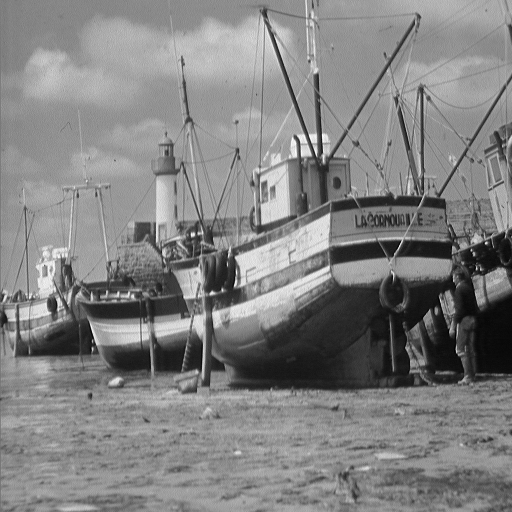

In [ ]:
# Ejemplo 1
img_boat = load_image("boat.512.tiff")
print(img_boat.shape)  # Muestra el tamaño de la matriz
print(img_boat)        # Muestra los valores de la matriz
img_boat  # Colab permite mostrar directamente la imagen de manera interactiva

(512, 512, 3)


array([[[  2,   0, 166],
        [211, 227, 214],
        [ 70, 227, 214],
        ...,
        [222, 237, 213],
        [222, 225, 199],
        [222, 186, 170]],

       [[ 72,   0,  61],
        [223, 226, 214],
        [223, 227, 214],
        ...,
        [194, 206, 170],
        [ 60,  76,  43],
        [ 58,  67,  45]],

       [[ 71,   0,  58],
        [218, 220, 207],
        [218, 222, 210],
        ...,
        [168, 195, 158],
        [ 61,  72,  47],
        [ 57,  65,  42]],

       ...,

       [[ 84,   0,  77],
        [216, 202, 203],
        [215, 203, 204],
        ...,
        [200, 199, 185],
        [ 71,  83,  23],
        [ 66,  73,  38]],

       [[ 84,   0,  78],
        [217, 200, 199],
        [219, 202, 202],
        ...,
        [207, 197, 187],
        [ 74,  83,  25],
        [ 65,  74,  38]],

       [[ 82,   0,   0],
        [212,   0,   0],
        [216,   0,   0],
        ...,
        [207,   0,   0],
        [ 73,   0,   0],
        [ 68,   0,   0]]], dtype=uint8)
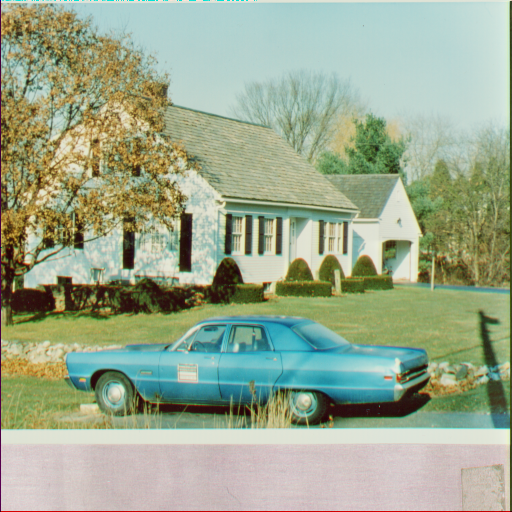

In [ ]:
# Ejemplo 2
img_house = load_image("house.tiff")
print(img_house.shape)
print(img_house[:,:,2])
img_house


Podemos ver que la imagen en escala de grises tiene dimensiones $(H, W) = (512, 512)$, donde $H$ representa el alto (height) y $W$ representa el ancho (width). Por otro lado, la imagen a color tiene dimensiones $(H, W, C) = (512, 512, 3)$, con una tercera componente para los canales RGB (red - green - blue).

Es importante recordar que la primera dimensión $H$ corresponde al eje $y$ en un sistema de coordenadas cartesiano, y que el origen se encuentra en la esquina superior izquierda de la imagen.

Veamos ahora cómo podemos manipular el contenido de las imágenes utilizando índices:

array([[173, 157, 171, ..., 152, 142, 158],
       [168, 159, 163, ..., 159, 147, 152],
       [156, 164, 158, ..., 155, 151, 150],
       ...,
       [144, 154, 163, ..., 116, 192, 140],
       [ 96, 118, 125, ..., 111, 149, 110],
       [ 55,  75,  84, ...,  91, 108,  99]], dtype=uint8)
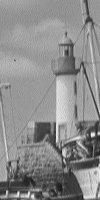

In [ ]:
# Muestra el contenido de la imagen desde la fila 100 (incluida) hasta
# la fila 300 (no incluida), y desde la columna 100 (incluida) hasta la
# columna 200 (no incluida)
img_boat[100:300, 100:200]

array([[125, 147, 140, ..., 156, 154, 158],
       [125, 141, 143, ..., 156, 150, 160],
       [124, 148, 143, ..., 151, 156, 152],
       ...,
       [ 86,  86,  51, ...,  20,  16,  16],
       [ 74,  71,  39, ...,  16,  12,  11],
       [ 73,  61,  50, ...,  11,  11,  14]], dtype=uint8)
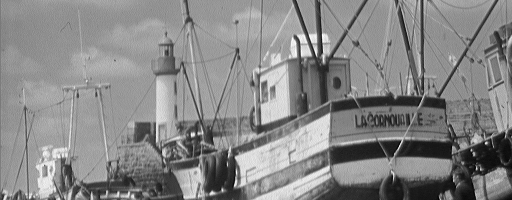

In [ ]:
# Muestra el contenido de la imagen desde la fila 100 (incluida) hasta
# la fila 300 (no incluida), y todas las columnas
img_boat[100:300, :]

array([[160, 161, 135, ..., 101,  93,  99],
       [161, 153, 145, ...,  99, 101, 106],
       [156, 162, 137, ...,  97, 106, 108],
       ...,
       [200, 202, 203, ...,  40,  39,  41],
       [211, 210, 212, ...,  40,  42,  40],
       [207, 202, 191, ...,  41,  40,  41]], dtype=uint8)
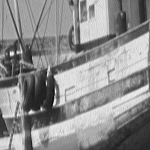

In [ ]:
# Mostramos un crop central de 150x150 pixeles
h_boat, w_boat = img_boat.shape
crop_size = 150
y_lower = h_boat // 2 - crop_size // 2
y_upper = h_boat // 2 + crop_size // 2
x_lower = w_boat // 2 - crop_size // 2
x_upper = w_boat // 2 + crop_size // 2
img_boat[y_lower : y_upper, x_lower : x_upper]

Visualicemos ahora la escala de intensidad de los pixeles en una imagen en escala de grises:

In [ ]:
def show_pixels_values(img_name):
    '''
    Asumiremos que la imagen está en escala de grises
    '''
    img = load_image(img_name)
    fig, ax = plt.subplots()
    im = ax.imshow(img, cmap='gray')
    fig.colorbar(im)

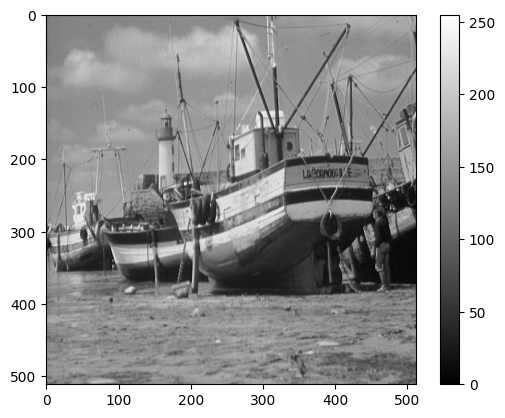

In [ ]:
show_pixels_values("boat.512.tiff")

Ahora definiremos una función para visualizar los 3 canales individuales de una imagen RGB:

In [ ]:
def show_img_channels(img_name):
    img = load_image(img_name)
    channels_dict = {0: 'Reds', 1: 'Greens', 2: 'Blues'}
    fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(16, 6))
    ax[0].imshow(img)
    ax[0].set_title("original image")
    for i in range(img.shape[-1]):
        ax[i+1].imshow(img[:, :, i], cmap=channels_dict[i])
        ax[i+1].set_title(f"{channels_dict[i]} channel")

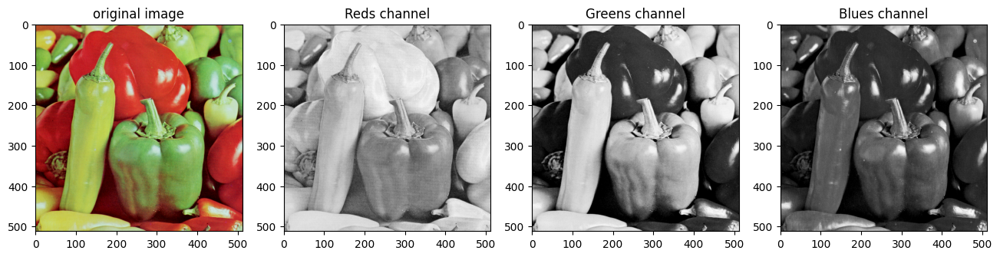

In [ ]:
show_img_channels("4.2.07.tiff")

## ❓¿Por qué aparecen en escalas de grises? ¿No que estamos intentando mostrar canales Rojo, Verde y Azul?

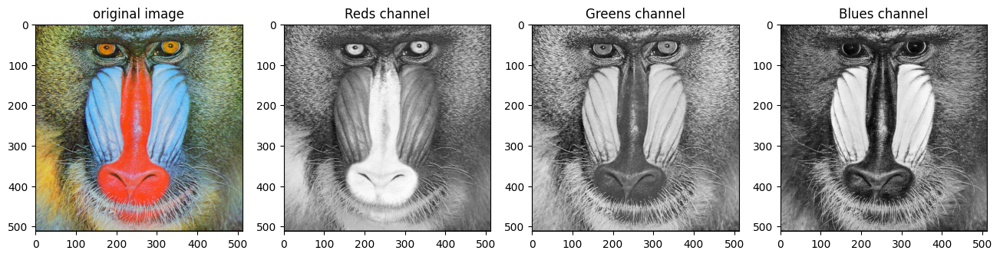

In [ ]:
show_img_channels("4.2.03.tiff")

Para convertir una imagen en RGB a una imagen en escala de grises, podemos utilizar la siguiente relación:

$\text{gris} = 0.299 \times \text{rojo} + 0.587 \times \text{verde} + 0.114 \times \text{azul}$

In [ ]:
def rgb_to_gray(img):
    '''
    Recibe la representación matricial (np.array) de una imagen en RGB
    y retorna una nueva matriz con la imagen en escala de grises
    '''
    gray_img = 0.299 * img[:, :, 0] + 0.587 * img[:, :, 1] + 0.114 * img[:, :, 2]
    return gray_img.astype('uint8')

In [ ]:
def plot_rgb_to_gray(img_name):
    '''
    Asumiremos que la entrada es el nombre de una imagen en RGB
    '''
    rgb_img = load_image(img_name)
    gray_img = rgb_to_gray(rgb_img)
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
    ax[0].imshow(rgb_img)
    ax[0].set_title("RGB image")
    ax[1].imshow(gray_img, cmap='gray')
    ax[1].set_title("Grayscale image")

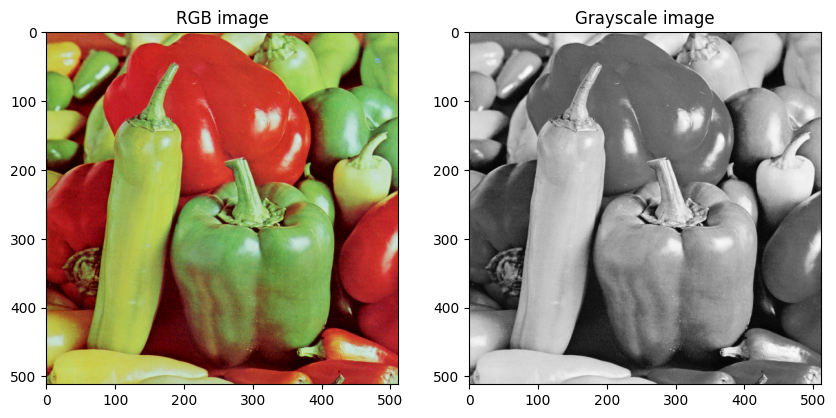

In [ ]:
plot_rgb_to_gray("4.2.07.tiff")

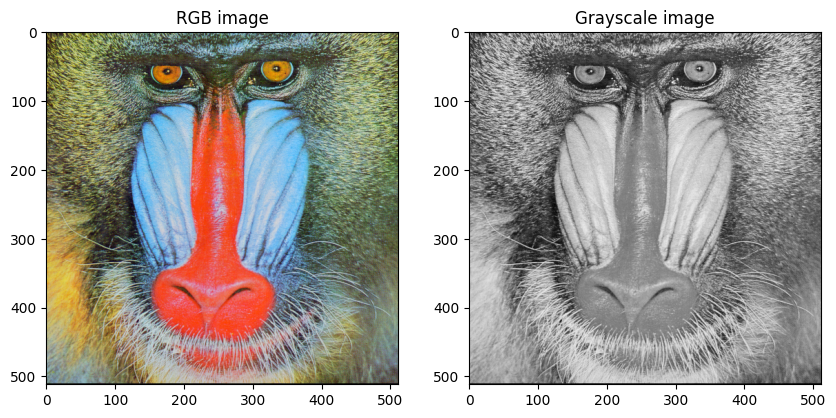

In [ ]:
plot_rgb_to_gray("4.2.03.tiff")

## Operaciones

### Histograma

In [ ]:
def compute_histogram(img, normalize=False):
    '''
    Recibe la representación matricial (np.array) de una imagen en escala de grises
    y retorna un vector que representa su histograma
    '''
    # Cálculo del histograma
    h, w = img.shape
    histogram = np.zeros(256)
    for i in range(h):
        for j in range(w):
            value = img[i][j]
            histogram[value] += 1
    if normalize:
        histogram = histogram / (h * w)  # normalizamos por la cantidad de pixeles
    return histogram

In [ ]:
def plot_histogram(img_name, normalize=False):
    '''
    Asumiremos que la imagen está en escala de grises
    '''
    img = load_image(img_name)
    histogram = compute_histogram(img, normalize)
    # Graficamos el resultado
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Image')
    ax[1].bar(range(256), histogram, color='black')
    if normalize:
        ax[1].set_title("Histogram (normalized)")
    else:
        ax[1].set_title("Histogram")

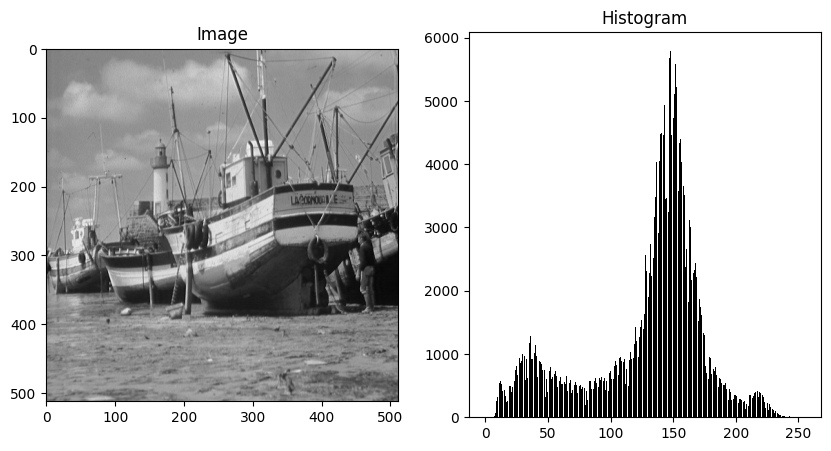

In [ ]:
plot_histogram("boat.512.tiff")

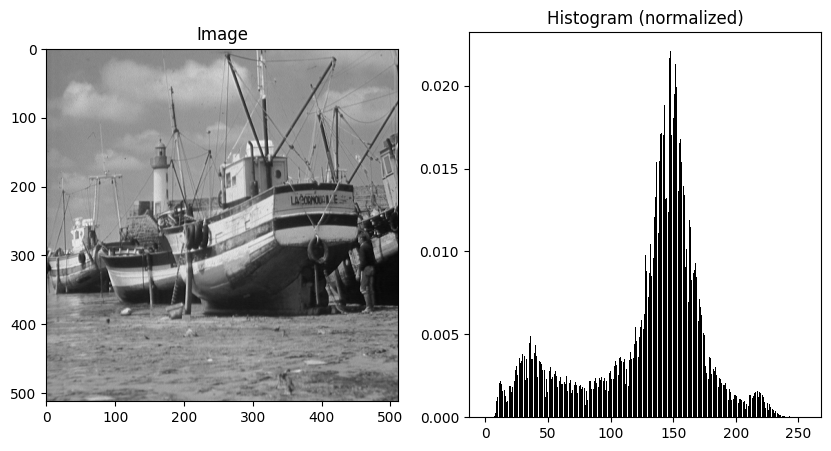

In [ ]:
plot_histogram("boat.512.tiff", normalize=True)

## ❓¿Qué efecto tuvo sobre el histograma la normalización? ¿Por qué es relevante/útil normalizar un histograma?

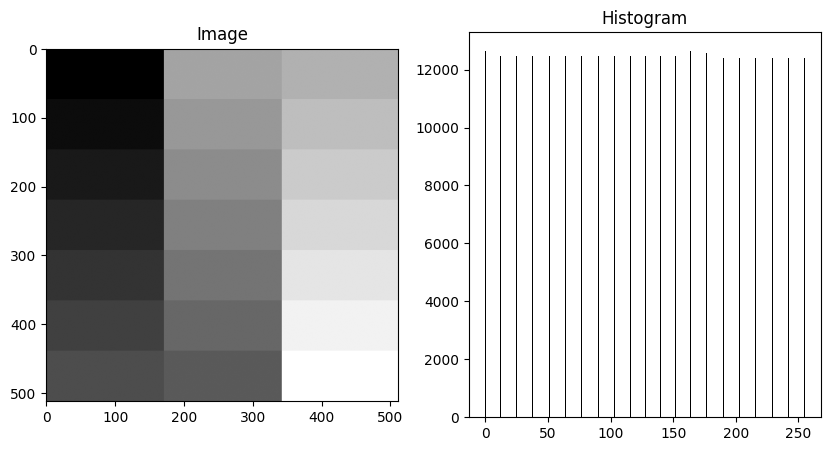

In [ ]:
plot_histogram("gray21.512.tiff")

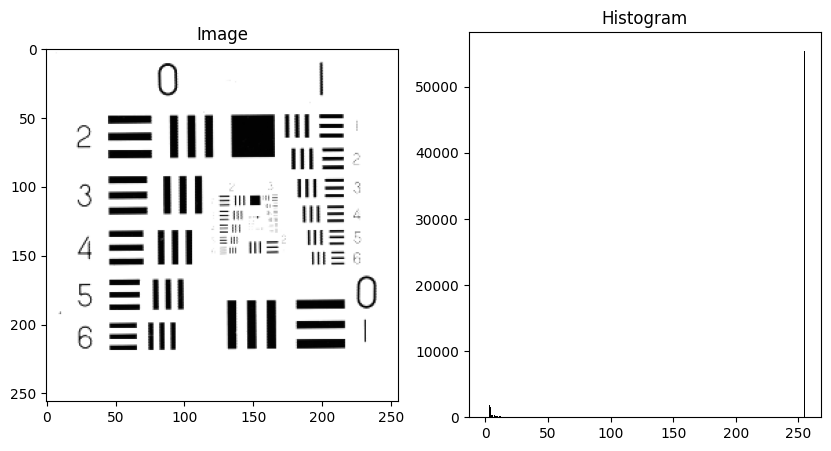

In [ ]:
plot_histogram("5.1.13.tiff")

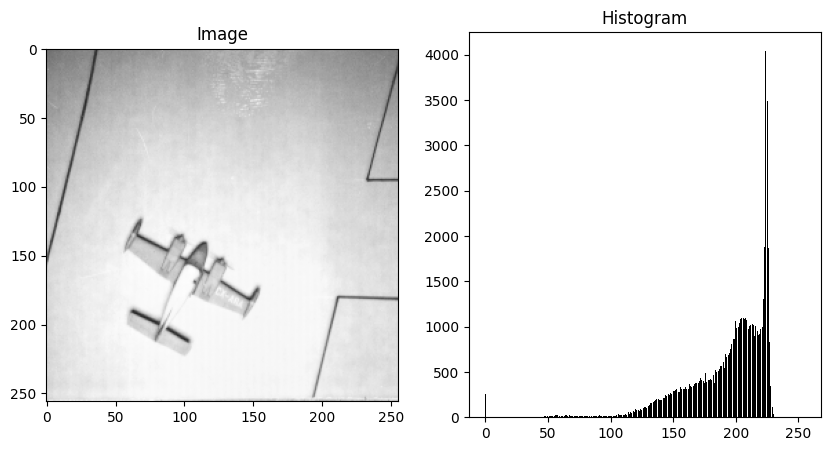

In [ ]:
plot_histogram("5.1.11.tiff")

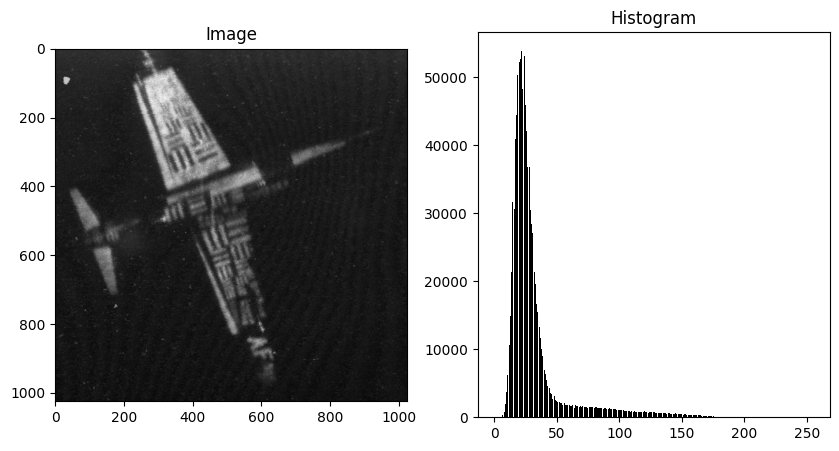

In [ ]:
plot_histogram("7.2.01.tiff")

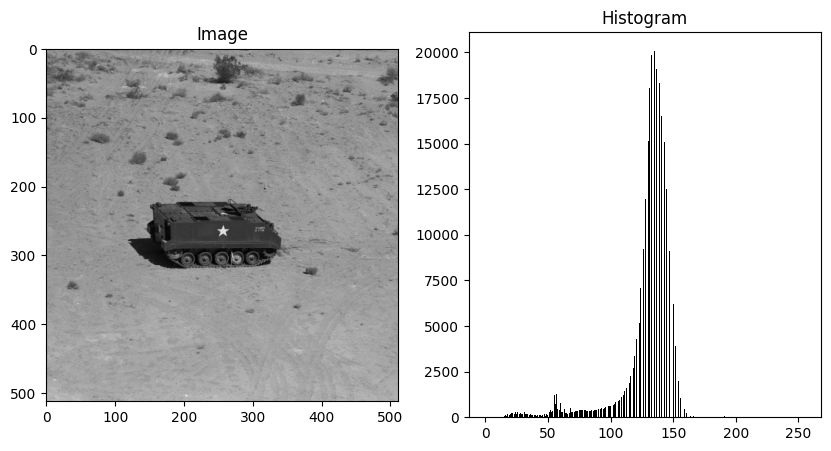

In [ ]:
plot_histogram("7.1.08.tiff")

### Histograma acumulado

In [ ]:
def compute_cumulative_hist(img):
    '''
    Recibe la representación matricial (np.array) de una imagen en escala de grises
    y retorna un vector que representa su histograma acumulado
    '''
    # Calculamos el histograma "original"
    histogram = compute_histogram(img)

    # Calculamos el histograma acumulado a partir del anterior
    cumulative_hist = np.zeros(256)
    cumulative_hist[0] = histogram[0]
    for i in range(1, 256):
        cumulative_hist[i] = cumulative_hist[i - 1] + histogram[i]

    return cumulative_hist

In [ ]:
def plot_cumulative_hist(img_name):
    '''
    Asumiremos que la imagen está en escala de grises
    '''
    img = load_image(img_name)
    cumulative_hist = compute_cumulative_hist(img)

    # Graficamos el resultado
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Image')
    ax[1].bar(range(256), cumulative_hist, color='black')
    ax[1].set_title("Cumulative histogram")

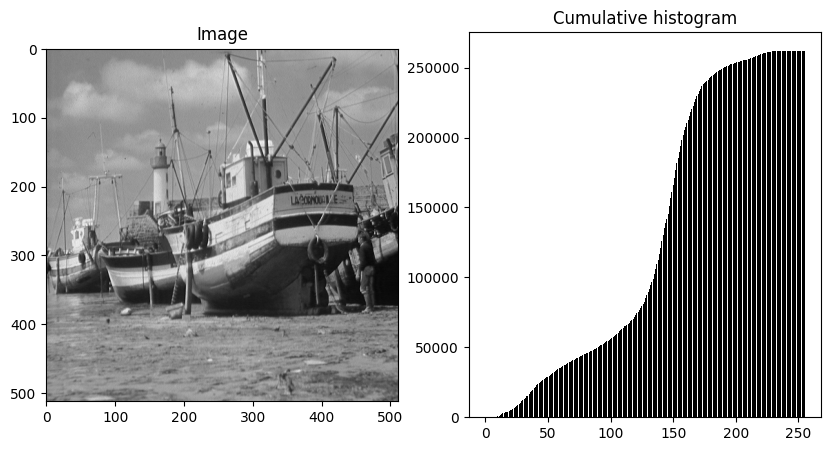

In [ ]:
plot_cumulative_hist("boat.512.tiff")

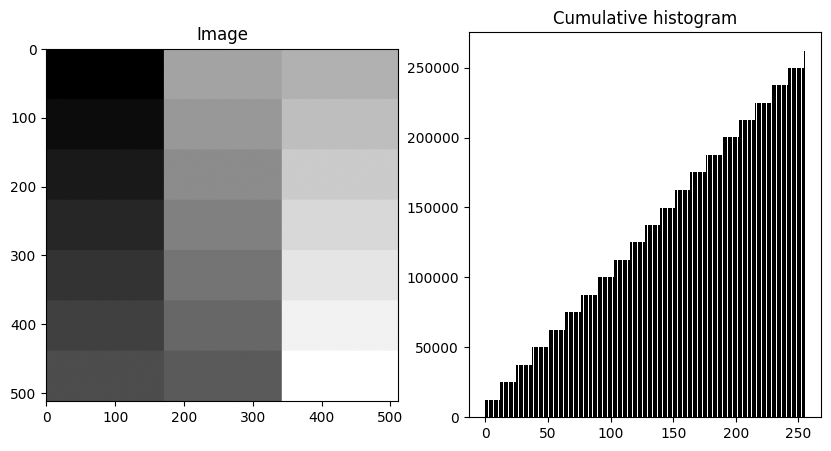

In [ ]:
plot_cumulative_hist("gray21.512.tiff")

### Imagen negativa

In [ ]:
def compute_negative_img(img):
    '''
    Recibe la representación matricial (np.array) de una imagen en escala de grises
    y retorna una nueva matriz que representa el negativo de la imagen
    '''
    max_value = 255
    negative_img = max_value - img
    return negative_img

In [ ]:
def plot_negative_img(img_name):
    '''
    Asumiremos que la imagen está en escala de grises
    '''
    img = load_image(img_name)
    negative_img = compute_negative_img(img)
    # Graficamos el resultado
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Original image')
    ax[1].imshow(negative_img, cmap='gray')
    ax[1].set_title("Negative image")

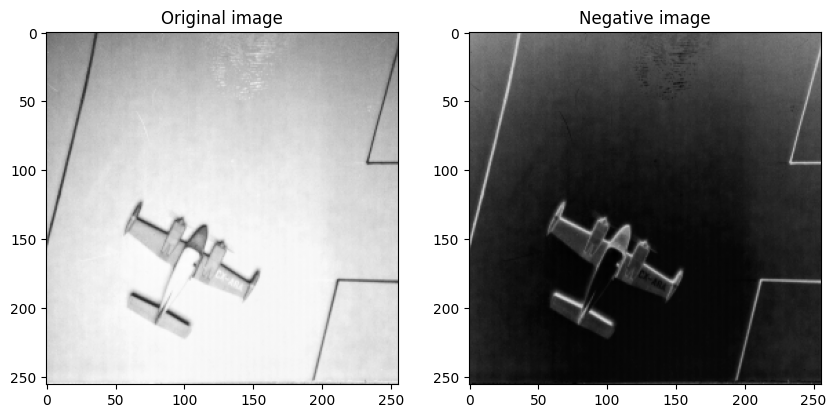

In [ ]:
plot_negative_img("5.1.11.tiff")

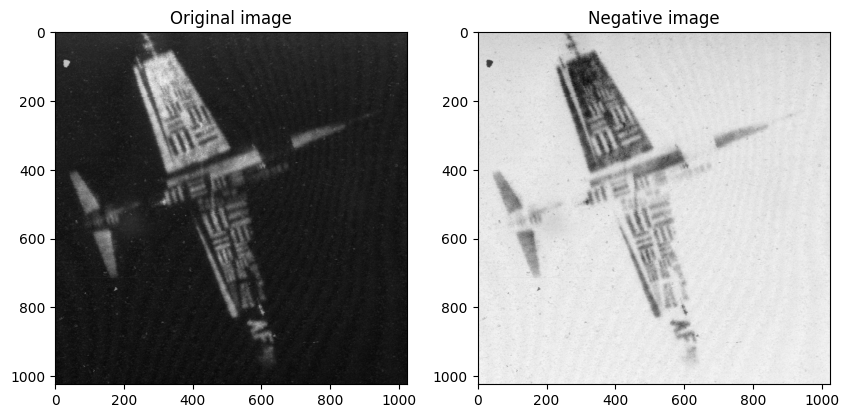

In [ ]:
plot_negative_img("7.2.01.tiff")

## Binarización

### Umbral fijo

In [ ]:
def compute_basic_binarization(img, thr):
    '''
    Recibe la representación matricial (np.array) de una imagen en escala de grises
    y retorna una imagen binaria, donde cada pixel tiene el valor True (o 1)
    si es que su valor es mayor que el umbral thr, y False (o 0) si no.
    '''
    return img > thr

In [ ]:
def plot_basic_binarization(img_name):
    '''
    Asumiremos que la imagen está en escala de grises
    '''
    img = load_image(img_name)

    # Probaremos varios valores para el umbral de binarización
    thresholds = [50, 100, 150, 200, 250]
    fig, ax = plt.subplots(nrows=1, ncols=len(thresholds) + 1, figsize=(16, 6), layout="constrained")
    im = ax[0].imshow(img, cmap='gray')
    ax[0].set_title("Original")
    for ix, thr in enumerate(thresholds):
        img_bin = compute_basic_binarization(img, thr)
        ax[ix+1].imshow(img_bin, cmap='gray')
        ax[ix+1].set_title(f"thr = {thr}")
        # ax[ix+1].axis("off")
        ax[ix+1].set_xticks([])
        ax[ix+1].set_yticks([])
    fig.colorbar(im, ax=ax[0], shrink=0.4)

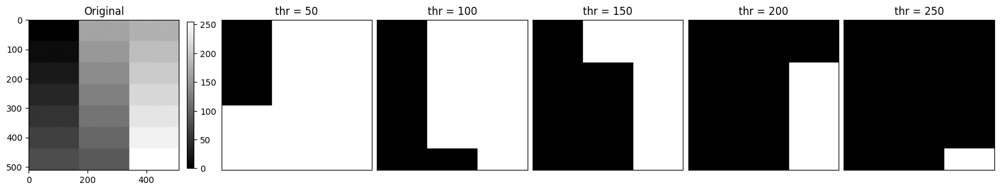

In [ ]:
plot_basic_binarization("gray21.512.tiff")

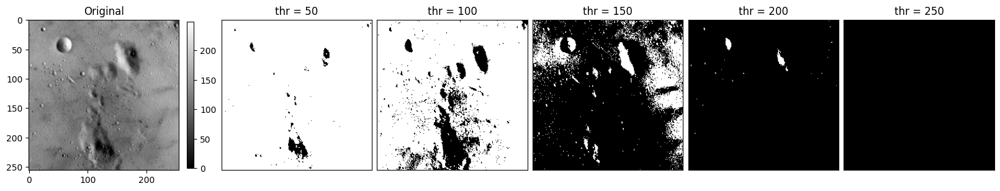

In [ ]:
plot_basic_binarization("5.1.09.tiff")

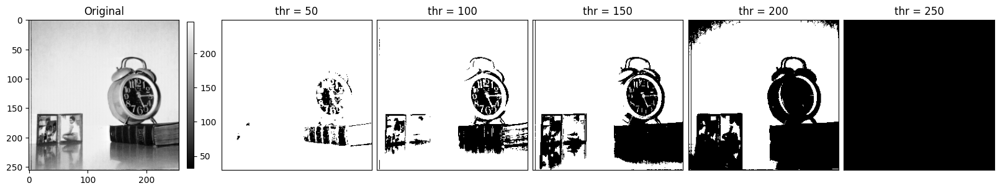

In [ ]:
plot_basic_binarization("5.1.12.tiff")

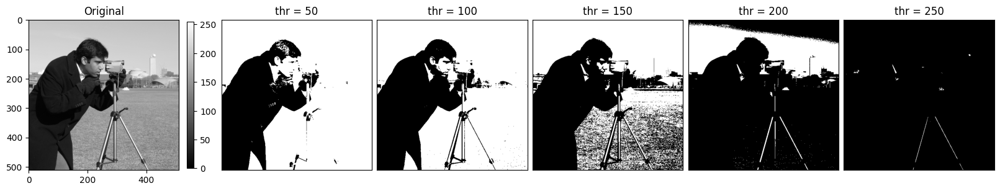

In [ ]:
plot_basic_binarization("camera.png")

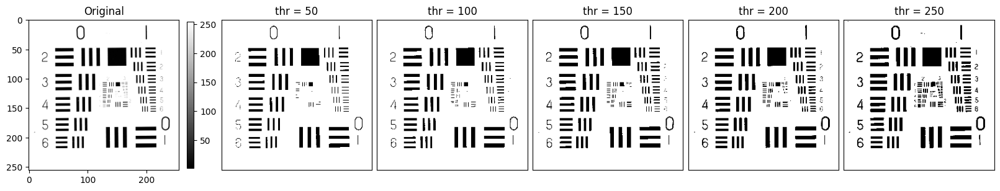

In [ ]:
plot_basic_binarization("5.1.13.tiff")

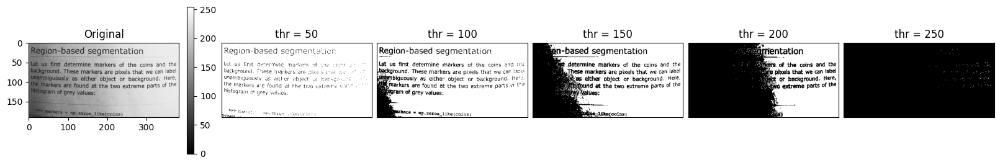

In [ ]:
plot_basic_binarization("page.png")

### Algoritmo de Otsu

Usaremos la implementación de skimage:

https://scikit-image.org/docs/0.25.x/api/skimage.filters.html#skimage.filters.threshold_otsu

In [ ]:
def compute_otsu_binarization(img):
    '''
    Recibe la representación matricial (np.array) de una imagen en escala de grises
    y retorna dos valores:

    otsu_thr (float): el valor del umbral obtenido con el algoritmo de Otsu
    bin_img (np.array): la imagen luego de binarizar con el umbral otsu_thr
    '''
    otsu_thr = filters.threshold_otsu(img)
    bin_img = img > otsu_thr
    return otsu_thr, bin_img

In [ ]:
def plot_otsu_binarization(img_name):
    '''
    Asumiremos que la imagen está en escala de grises
    '''
    img = load_image(img_name)
    otsu_thr, bin_img = compute_otsu_binarization(img)

    # También mostraremos el histograma con el umbral encontrado
    histogram = compute_histogram(img)

    # Graficar
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
    im = ax[0].imshow(img, cmap='gray')
    # Imagen original
    ax[0].set_title("Original")
    # Histograma
    ax[1].bar(range(256), histogram, color='black')
    ax[1].axvline(otsu_thr, color='r')
    ax[1].set_title(f"Histogram")
    # Imagen binarizada
    ax[2].imshow(bin_img, cmap='gray')
    ax[2].set_title(f"otsu_thr = {round(otsu_thr)}")

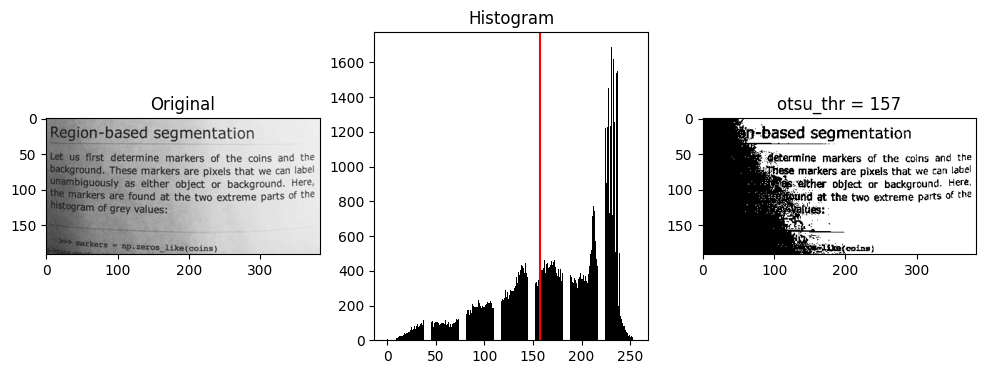

In [ ]:
plot_otsu_binarization("page.png")

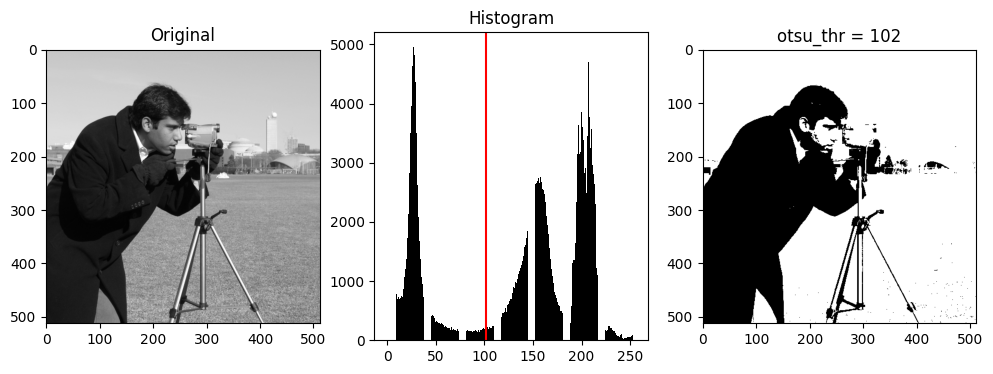

In [ ]:
plot_otsu_binarization("camera.png")

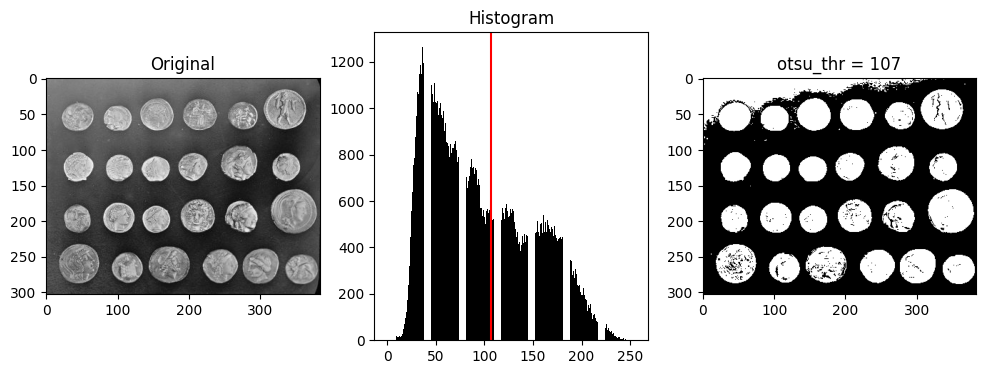

In [ ]:
plot_otsu_binarization("coins.png")

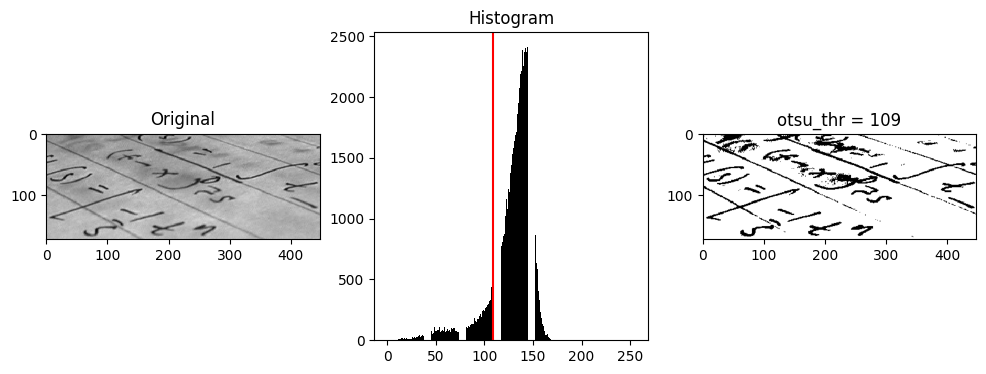

In [ ]:
plot_otsu_binarization("text.png")

### Binarización adaptativa

Usaremos la implementación de skimage:

https://scikit-image.org/docs/0.25.x/api/skimage.filters.html#skimage.filters.threshold_local

In [ ]:
def compute_adaptive_binarization(img, block_size=5):
    '''
    Recibe la representación matricial (np.array) de una imagen en escala de grises
    y retorna la imagen luego de aplicar una binarización adaptativa local
    '''
    adaptive_thr = filters.threshold_local(img, block_size=block_size, offset=10)
    bin_img = img > adaptive_thr
    return bin_img

In [ ]:
def plot_adaptive_binarization(img_name):
    '''
    Asumiremos que la imagen está en escala de grises
    '''
    img = load_image(img_name)

    # Probaremos varios valores para el tamaño de la vecindad
    block_sizes = [5, 15, 35]
    fig, ax = plt.subplots(nrows=1, ncols=len(block_sizes) + 1, figsize=(16, 6))
    im = ax[0].imshow(img, cmap='gray')
    ax[0].set_title("Original")
    for ix, block_size in enumerate(block_sizes):
        img_bin = compute_adaptive_binarization(img, block_size)
        ax[ix+1].imshow(img_bin, cmap='gray')
        ax[ix+1].set_title(f"block_size={block_size}")
        # ax[ix+1].axis("off")
        ax[ix+1].set_xticks([])
        ax[ix+1].set_yticks([])

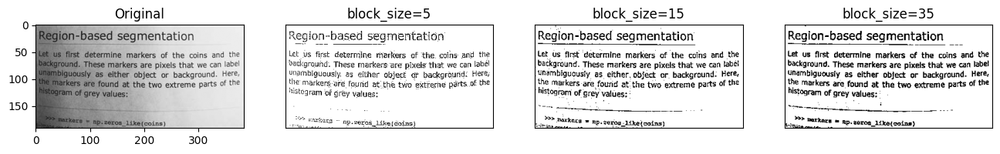

In [ ]:
plot_adaptive_binarization("page.png")

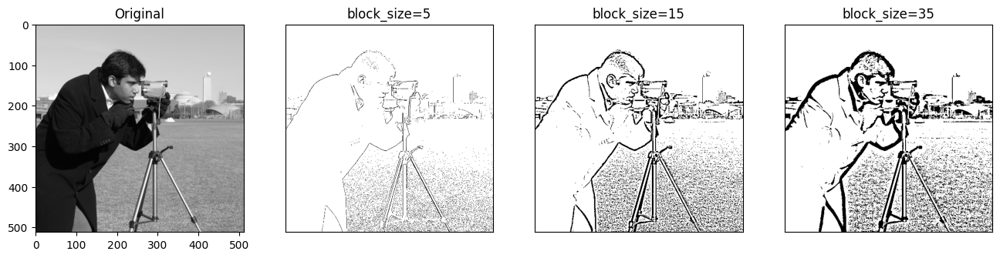

In [ ]:
plot_adaptive_binarization("camera.png")

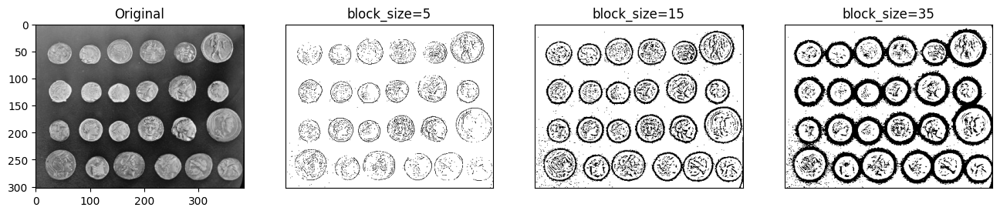

In [ ]:
plot_adaptive_binarization("coins.png")

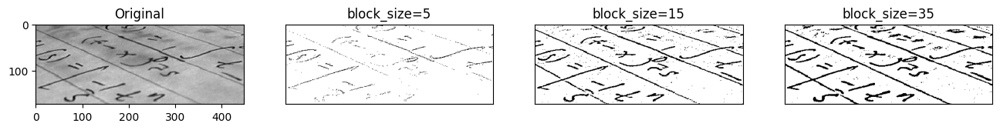

In [ ]:
plot_adaptive_binarization("text.png")

Finalmente, veamos algunos ejemplos del algoritmo de Otsu vs el método adaptativo:

In [ ]:
def compare_binarization(img_name):
    '''
    Asumiremos que la imagen está en escala de grises
    '''
    img = load_image(img_name)
    otsu_thr, otsu_bin = compute_otsu_binarization(img)
    adaptive_bin = compute_adaptive_binarization(img, block_size=35)

    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(14, 6))
    # Imagen original
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title("Original")
    # Binarización con Otsu
    ax[1].imshow(otsu_bin, cmap='gray')
    ax[1].set_title("Otsu")
    # Binarización adaptativa
    ax[2].imshow(adaptive_bin, cmap='gray')
    ax[2].set_title("Adaptive")

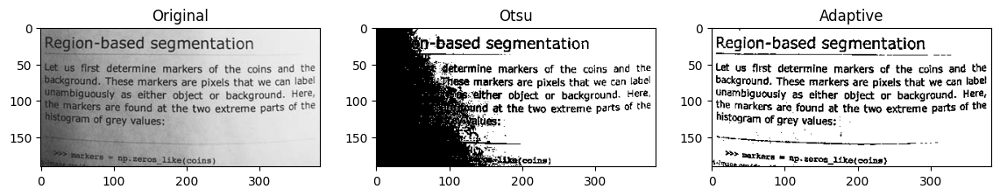

In [ ]:
compare_binarization("page.png")

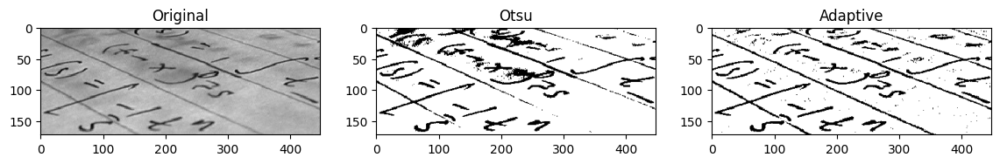

In [ ]:
compare_binarization("text.png")

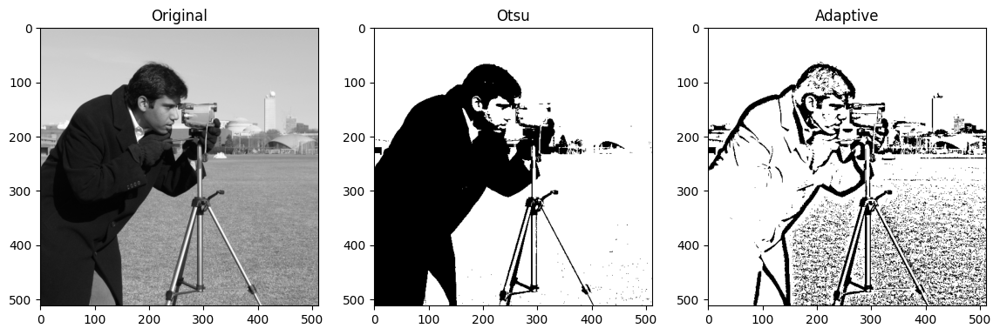

In [ ]:
compare_binarization("camera.png")

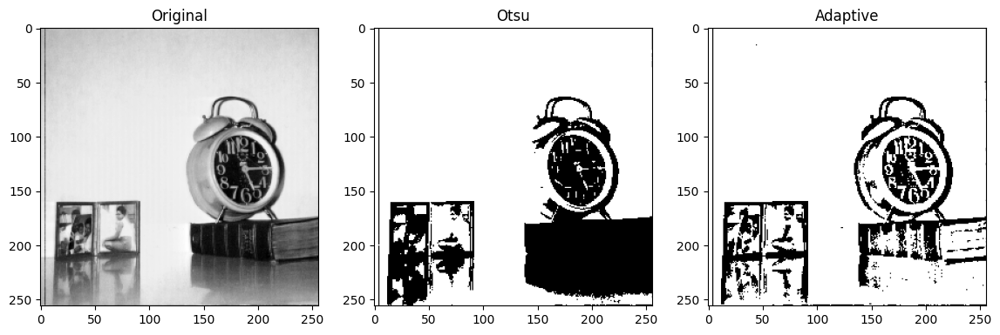

In [ ]:
compare_binarization("5.1.12.tiff")

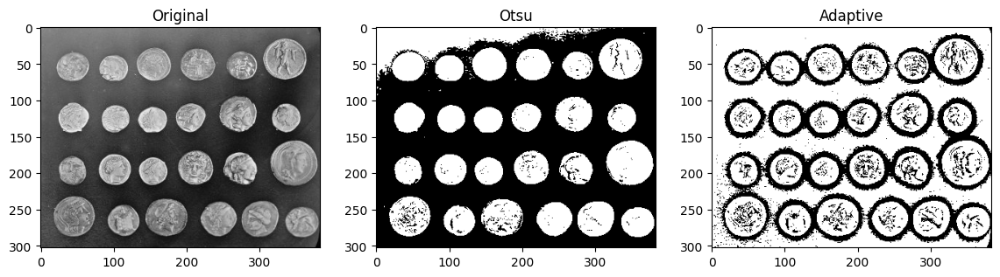

In [ ]:
compare_binarization("coins.png")

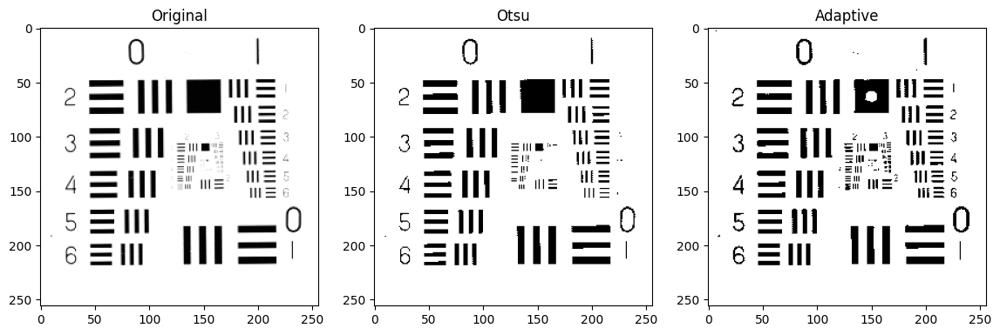

In [ ]:
compare_binarization("5.1.13.tiff")

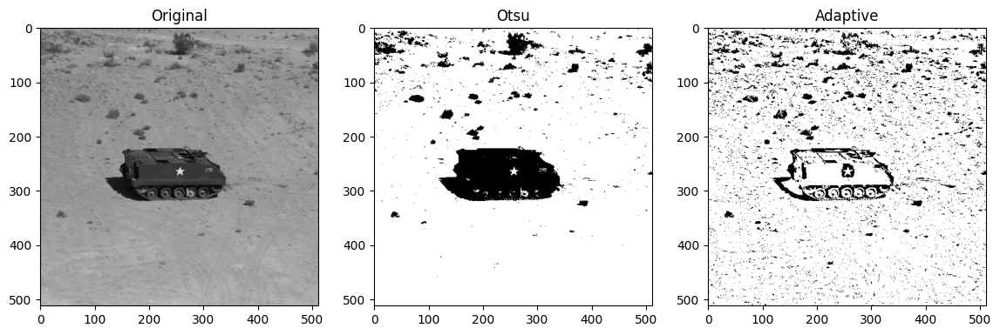

In [ ]:
compare_binarization("7.1.08.tiff")